<img src="https://raw.githubusercontent.com/CristianR8/Imagenes-Espectrales-Sesion4-Parte1-HoCV/main/images/banner-spectral.png" width="1000" align="middle"/>

---



# <font color='#ECA702'>**Hands-on Sesión 4: Breve introducción al desmezclado Espectral 🔍**</font>


# <font color='#4C5FDA'>**Objetivo**</font>


En teledetección, el espectro de un píxel se compone de más de un material, lo que se conoce como píxel "mixto". Por ejemplo, en la imagen siguiente (las líneas amarillas designan los píxeles), si midiéramos el espectro del píxel central, tendría firmas de árbol, hierba y arena. A menudo es útil conocer el porcentaje de cada material en cada píxel, lo que se denomina desmezcla hiperespectral.

<img src="https://raw.githubusercontent.com/CristianR8/Imagenes-Espectrales-Sesion4-Parte1-HoCV/main/images/Picture05.png" width="600" align="middle"/>

El objetivo del desmezclado hiperespectral es descomponer un cubo de imagen en las firmas espectrales puras que se encuentran en una escena (llamadas endmembers) y la cantidad (o proporción) de cada endmember que se encuentra en cada píxel. Las firmas espectrales puras son aquellas que sólo tienen UN material. Se trata de un análisis subpixel ya que estamos determinando cantidades subpixel de cada material en cada pixel.

Cuando se realiza unmixing hiperespectral, primero debemos asumir un modelo de mezcla particular.  

El modelo de mezcla más utilizado en la práctica es el *Modelo de Mezcla Lineal* (también conocido como *Modelo de Geometría Convexa*).  Aunque es el más utilizado, a menudo no se cumple en la práctica.

<img src="https://raw.githubusercontent.com/CristianR8/Imagenes-Espectrales-Sesion4-Parte1-HoCV/main/images/Picture07.png" align="middle"/>



Para esta sesión usaremos dos algoritmos que nos permitirán realizar el desmezcaldo espectral, a continuacion hablaremos de ellos.

# <font color='#ECA702'>**Pixel Purity Index (PPI)**</font>

<div style='text-align: justify;'>
    El Pixel Purity Index (PPI) es un algoritmo utilizado en el procesamiento de imágenes de teledetección, especialmente en el análisis de imágenes hiperespectrales, para identificar los píxeles más puros de un conjunto de datos. Estos píxeles puros representan firmas espectrales únicas que corresponden a materiales específicos presentes en la imagen. El algoritmo se basa en la proyección iterativa de los datos de la imagen sobre un plano generado aleatoriamente, identificando los píxeles que se proyectan a los extremos del espacio de datos como los más puros. Este proceso se repite múltiples veces, acumulando la frecuencia con la que cada píxel se identifica como puro. Los píxeles que se identifican con mayor frecuencia se consideran representativos de materiales únicos en la escena, y se pueden utilizar para la clasificación de la cobertura terrestre, la identificación de minerales, o el análisis de vegetación, entre otros.
</div>

# <font color='#ECA702'>**Fully Constrained Least Squares (FCLS)**</font>

<div style='text-align: justify;'>
    El Fully Constrained Least Squares (FCLS) es un algoritmo de desmezcla espectral utilizado en el análisis de imágenes hiperespectrales. Su objetivo es descomponer el espectro de un píxel mixto en las firmas espectrales de los componentes puros (endmembers) presentes en ese píxel, estimando la abundancia de cada componente. A diferencia de otros métodos de desmezcla, el FCLS incorpora dos restricciones importantes: las abundancias estimadas deben ser no negativas y la suma de todas las abundancias en un píxel debe ser igual a uno (conservación de la masa). Estas restricciones aseguran que las soluciones sean físicamente plausibles. El FCLS es ampliamente utilizado en aplicaciones de teledetección para cuantificar la cobertura y la composición de la superficie terrestre, como la identificación de tipos de vegetación, el mapeo de minerales, o la evaluación de la urbanización, proporcionando una herramienta valiosa para el análisis ambiental y de recursos naturales.
</div>

# <font color='#ECA702'>**Spectral Mixture Analysis by Penalized Constrained Least Squares (SPICE)**</font>


El algoritmo SPICE es una técnica de desmezcla espectral utilizada para determinar las proporciones de diferentes materiales presentes en los datos de imágenes hiperespectrales. Utiliza un enfoque de mínimos cuadrados penalizados y restringidos para descomponer el espectro medido de un píxel en una combinación de espectros de referencia conocidos, ajustándose a las restricciones físicas y estadísticas para obtener resultados más realistas y precisos.






**Ahora procederemos a realizar la actividad de desmesclado espectral**

# <font color='#4C5FDA'>**Importamos datos necesarios**</font>

In [1]:
!pip install gdown
!gdown --id 1YefHbt0ogdPTLBtamUdlriYpziP1uxPA
!gdown --id 1Mt19kALTY9s4mrZaTRzhoOjHDoZraGxM
!gdown --id 1ceW10j7Puj3DvPTdO1IRLRnRe6KwlEqC
!gdown --id 16rW0Us9T9prLYkRkv_jLcqD3ET4Nl4Oa
!gdown --id 1zn8wG6nOEsU74RgGKUwAOj4GbC1dU3ej

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:138: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1YefHbt0ogdPTLBtamUdlriYpziP1uxPA
From (redirected): https://drive.google.com/uc?id=1YefHbt0ogdPTLBtamUdlriYpziP1uxPA&confirm=t&uuid=f38aadc3-fe83-48ba-977c-75135faaf2f6
To: /content/muufl_gulfport_campus_w_lidar_1.mat
100% 27.8M/27.8M [00:00<00:00, 31.5MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/cli.py:138: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1Mt19kALTY9s4mrZaTRzhoOjHDoZraGxM
From (redirected): https://drive.google.com/uc?id=1Mt19kALTY9s4mrZaTRzhoOjHDoZraGxM&confirm=t&uuid=1f01531a-0f4a-462c-9ea3-b5f1fc04c686
To: /content

# <font color='#4C5FDA'>**Importamos librerias**</font>

In [2]:
!pip install loadmat
!pip install pysptools
!pip install quadprog

ERROR: Could not find a version that satisfies the requirement loadmat (from versions: none)
ERROR: No matching distribution found for loadmat
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pysptools: filename=pysptools-0.15.0-py3-none-any.whl size=8133736 sha256=8fa4c31220373ab902ff86e75aae3ac74499dcf0379b7690a9bb2d47b1c86e10
  Stored in directory: /root/.cache/pip/wheels/ea/08/3b/c045ea3722a5fef1f8698f060a17b59140235fef580fe4f1b5
Successfully built pysptools
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 508.2/508.2 kB 6.3 MB/s eta 0:00:00


In [3]:
# # importaciones y configuración
import numpy as np
import loadmat
import pysptools
import pysptools.eea
import matplotlib.pyplot as plt
import matplotlib as mpl
import scipy.io
import pysptools.abundance_maps

from SPICE import *
from loadmat import loadmat
from IPython.display import display, HTML


%matplotlib inline
default_dpi = mpl.rcParamsDefault['figure.dpi']
mpl.rcParams['figure.dpi'] = default_dpi*2 # ejecutar esto para hacer las cifras más grandes, a menudo tienen que ejecutar el bloque varias veces para que tome

# <font color='#4C5FDA'>**Cargamos los datos**</font>

In [4]:
# Cargar imagen del campus de gulfport
img_fname = 'muufl_gulfport_campus_w_lidar_1.mat'
spectra_fname = 'tgt_img_spectra.mat'

dataset = loadmat(img_fname)['hsi']

hsi = dataset['Data']

In [5]:
hsi = dataset['Data'][:,:,4:-4]  # Recortar bandas ruidosas al inicio y al final del cubo de datos HSI (Imagen Hiperespectral)
valid_mask = dataset['valid_mask'].astype(bool)  # Crea una máscara booleana a partir de 'valid_mask' para identificar los píxeles válidos
n_r, n_c, n_b = hsi.shape  # Obtiene las dimensiones del cubo HSI recortado: número de filas (n_r), columnas (n_c) y bandas (n_b)
wvl = dataset['info']['wavelength'][4:-4]  # Obtiene las longitudes de onda de las bandas conservadas, excluyendo las bandas ruidosas
rgb = dataset['RGB']  # Extrae la imagen RGB correspondiente al dataset HSI para visualización

# <font color='#4C5FDA'><small>**Pixel Purity Index**</small></font>

Después de cargar los datos, vamos a extraer algunos endmembers utilizando el algoritmo Pixel Purity Index.  Este algoritmo supone que en la escena se pueden encontrar espectros puros para cada endmember.  Esta suposición no es válida para conjuntos de datos muy mezclados.

Por supuesto, hay MUCHOS algoritmos en la literatura además de PPI que estiman los espectros de los miembros finales.

# **<font color='#ECA702'>**<font color='#ECA702'>**<font color="#FF0000">R</font><font color="#FF7F00">e</font><font color="#FFFF00">t</font><font color="#00FF00">o</font><font color="#0000FF"> #</font><font color="#9400D3">1</font> 💪**</font>

* Extraer algunos endmembers mediante el algoritmo Pixel Purity Index usando PySptools de https://pysptools.sourceforge.io
* Ejercicio: Variar el número de endmembers y el número de pinchos para ver los cambios en la estimación de endmember.
* Trazar los endmembers que encontramos en una gráfica
* Encontrar abundancias dados los endmembers (Usando FCLS)
* Mostrar los mapas de abundancia en una gráfica


In [6]:
# Tratamiento de datos

hsi_array = np.reshape(hsi,(n_r*n_c,n_b)) # Cambiar de 3 a 2 dimensiones
valid_array = np.reshape(valid_mask,(n_r*n_c,)) # Convertir los mask a un vector
M = hsi_array[valid_array,:] # Datos

In [7]:
# extraer algunos endmembers mediante el algoritmo Pixel Purity Index
# usando PySptools de https://pysptools.sourceforge.io
# Ejercicio: Variar el número de endmembers y el número de 'spikes' para ver los
# cambios en la estimación de endmember.

q = 12 # Número de Endmembers
numSkewers = 10000 # Parámetro PPI del número de proyecciones utilizadas para encontrar
# puntos de datos extremos que pueden ser endmembers
E, inds = pysptools.eea.eea.PPI(M, q, numSkewers)

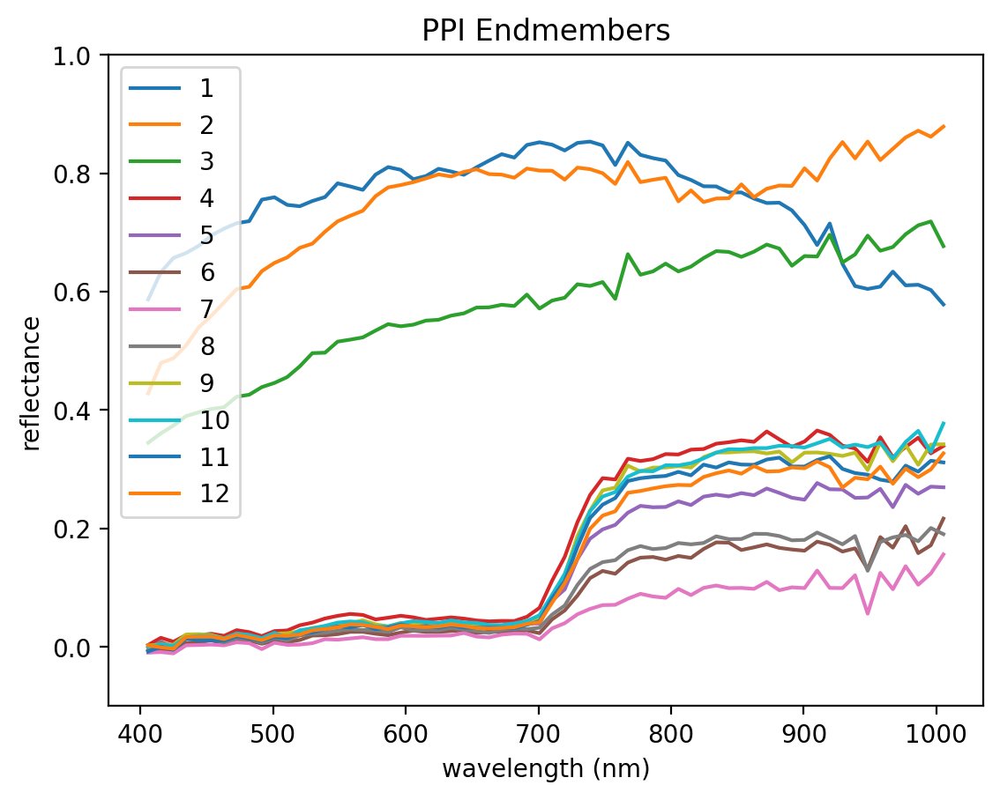

In [8]:
# Trazar los endmembers que encontramos
plt.plot(wvl,E.T)
plt.xlabel('wavelength (nm)')
plt.ylabel('reflectance')
plt.legend([str(i+1) for i in range(q)], loc = 'upper left')
plt.ylim((-0.1,1))
plt.title("PPI Endmembers")
plt.show()

A medida que se colocan más 'posibles' endmembers tiende a sacar más firmas espectrales pero que están muy juntas e incluso se superponen, por lo cuál intuyo que esas firmas que están tan juntas pertenecen a la misma clase y es mejor 'juntarlas' en una sola reduciendo el número de endmembers.

In [9]:
q = 6 # Número de Endmembers
numSkewers = 10000 # Parámetro PPI del número de proyecciones utilizadas para encontrar
# puntos de datos extremos que pueden ser endmembers
E, inds = pysptools.eea.eea.PPI(M, q, numSkewers)

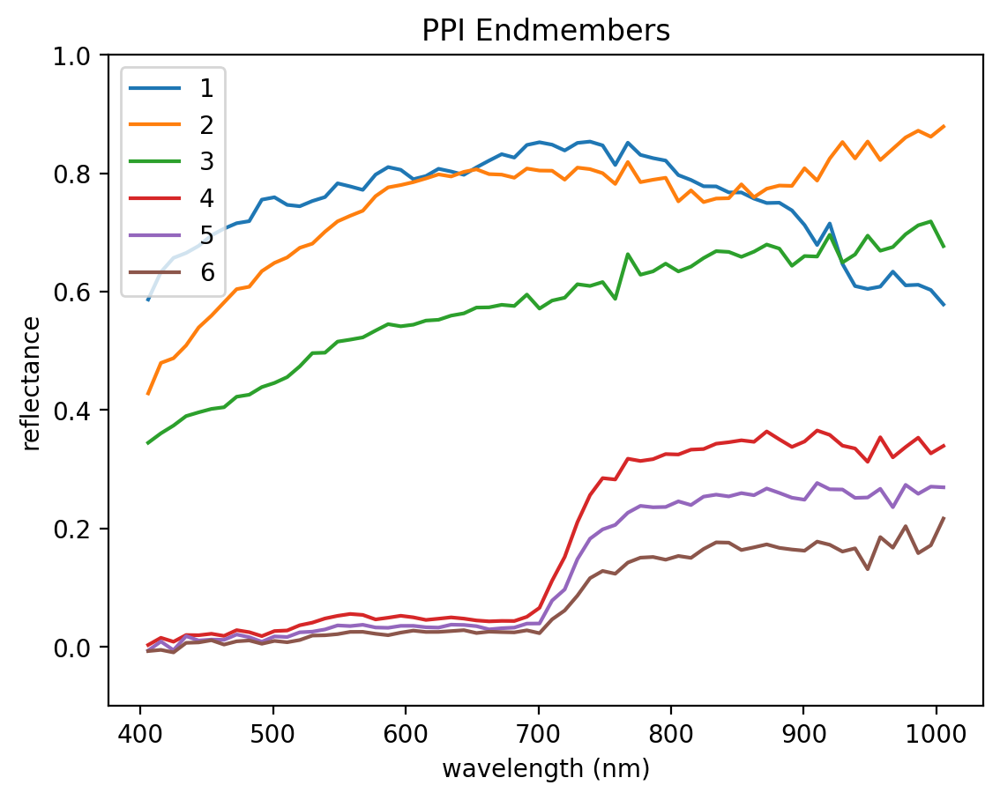

In [10]:
# Trazar los endmembers que encontramos
plt.plot(wvl,E.T)
plt.xlabel('wavelength (nm)')
plt.ylabel('reflectance')
plt.legend([str(i+1) for i in range(q)], loc = 'upper left')
plt.ylim((-0.1,1))
plt.title("PPI Endmembers")
plt.show()

# <font color='#4C5FDA'><small>**FCLS**</small></font>

Tras estimar los espectros de los miembros finales, podemos estimar las abundancias/proporciones de cada píxel de la imagen.  Para ello utilizaremos el algoritmo FCLS.  (Hay muchos algoritmos en la literatura que estiman proporciones dados los endmembers.  FCLS es sólo un ejemplo).

In [76]:
# Encontrar abundancias dados los endmembers

if M.shape[1] == E.shape[1]:
  # La documentación dice que M – numpy array 2D data matrix (N x p) y
  # U = E – numpy array 2D matrix of endmembers (q x p).
  print("Todo bien. No va a explotar.")

# Esto funciona lentamente con grandes conjuntos de datos/más endmembers.
maps = pysptools.abundance_maps.amaps.FCLS(M, E)

Todo bien. No va a explotar.


# <font color='#4C5FDA'><small>**Trazamos los mapas de abundancia para los miembros finales obtenidos con PPI y FCLS**</small></font>

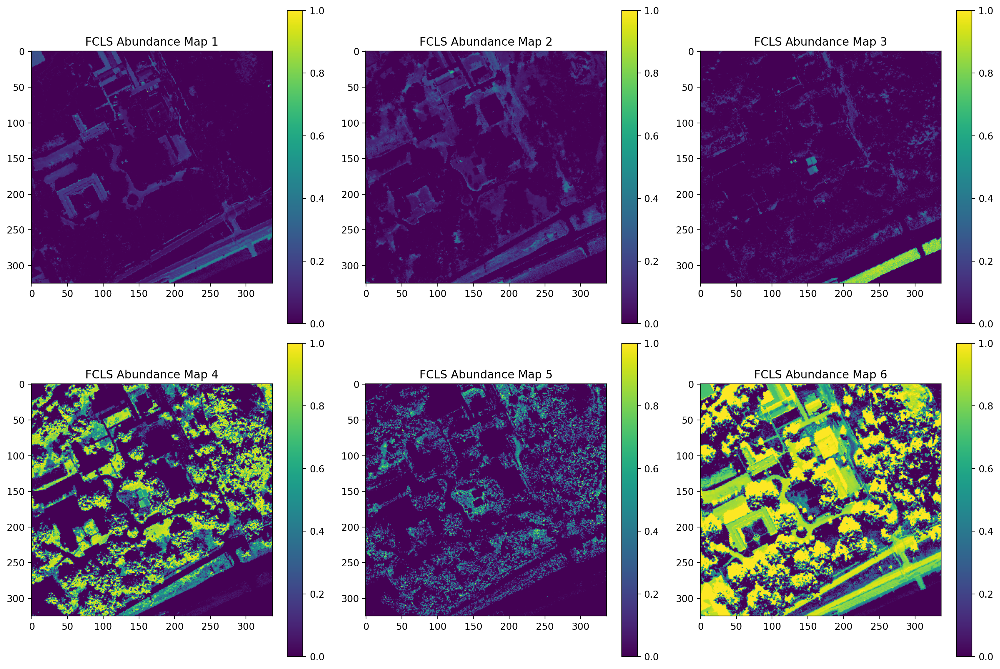

In [77]:
# NO MODIFIQUE ESTA CELDA
# Mostrar mapas de abundancia
map_imgs = []  # Inicializa una lista vacía para almacenar las imágenes de los mapas de abundancia
for i in range(q):  # Itera sobre cada componente q identificado
    map_lin = np.zeros((n_r*n_c,))  # Crea un array lineal lleno de ceros con tamaño igual al número total de píxeles
    map_lin[valid_array] = maps[:,i]  # Asigna los valores de abundancia del componente i a los píxeles válidos
    map_imgs.append(np.reshape(map_lin, (n_r, n_c)))  # Convierte el array lineal en una matriz 2D y la agrega a la lista

# Determina el número de filas y columnas para la cuadrícula de subplots
n_cols = 3  # Número de columnas por fila; ajustable según necesidad
n_rows = (q + n_cols - 1) // n_cols  # Calcula las filas necesarias, redondeando hacia arriba

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 5))  # Crea una figura y subplots con las dimensiones calculadas

# Si hay menos gráficos que espacios, hace invisibles los ejes no usados
for ax in axes.flat[len(map_imgs):]:
    ax.axis('off')

# Itera sobre el número de mapas y los grafica
for i, ax in enumerate(axes.flat):
    if i < len(map_imgs):  # Verifica si el índice está dentro del rango de mapas disponibles
        im = ax.imshow(map_imgs[i], vmin=0, vmax=1)  # Muestra el mapa de abundancia i con una escala de 0 a 1
        fig.colorbar(im, ax=ax)  # Añade una barra de color al subplot para indicar la escala
        ax.set_title(f'FCLS Abundance Map {i+1}')  # Establece el título del subplot

plt.tight_layout()  # Ajusta automáticamente los subplots para que encajen en la figura
plt.show()  # Muestra la figura con todos los mapas de abundancia


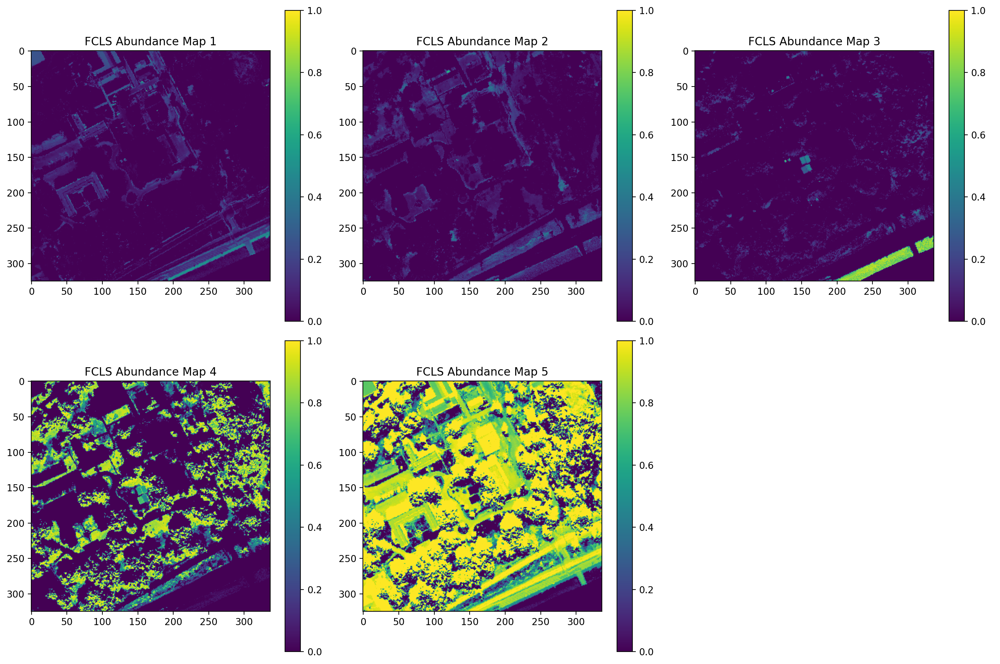

In [ ]:
# Resultados de referencia


# <font color='#4C5FDA'><small>**SPICE**</small></font>

Alternativamente, podemos estimar los endmembers, el número de endmembers y las abundancias simultáneamente utilizando el algoritmo SPICE.  SPICE también es aplicable a conjuntos de datos muy mezclados, ya que no supone que los espectros de los miembros finales puedan encontrarse en el conjunto de datos.  Por supuesto, éste es sólo un ejemplo de este tipo de algoritmo en la literatura.

El código Matlab para SPICE se puede encontrar aquí: <url>https://github.com/GatorSense/SPICE</url>

# <font color='#ECA702'>**<font color="#FF0000">R</font><font color="#FF7F00">e</font><font color="#FFFF00">t</font><font color="#00FF00">o</font> #<font color="#0000FF">2</font>** 💪</font>
* Ejecutar el algoritmo SPICE para encontrar el número de endmembers, endmembers y abundancias simultáneamente



In [25]:
# ejecutar SPICE para encontrar el número de endmembers, endmembers y abundancias
# simultáneamente
# Ejercicio: Variar los parámetros SPICE (en params) para ver el efecto en la
# estimación de endmember y parámetros.

# class SPICEParameters():

#     def __init__(self):
#         self.u = 0.001  #Trade-off parameter between RSS and V term
#         self.gamma = 5  #Sparsity parameter
#         self.M = 20  #Initial number of endmembers
#         self.endmemberPruneThreshold = 1e-9
#         self.changeThresh = 1e-4  #Used as the stopping criterion
#         self.iterationCap = 5000 #Alternate stopping criterion
#         self.produceDisplay = 1
#         self.initEM = None  #This randomly selects parameters.M initial endmembers from the input data

params = SPICEParameters()
# params.u =
# params.gamma =
# params.M =
# params.endmemberPruneThreshold =
# params.changeThresh =
# params.iterationCap =
# params.produceDisplay =

inputData = (M.T).astype('double')

In [8]:
# para ahorrar tiempo de procesamiento, reduzca el tamaño de los datos de entrada para procesar menos píxeles
dsData = inputData[:,::20]
dsData.shape

(64, 5347)

In [20]:
# ejecutar SPICE
[eM,dsP] = SPICE(inputData, params)

 
Change in Objective Function Value: inf
Minimum of Maximum Proportions: 0.9999999999995908
Number of Endmembers: 20
Iteration: 1
 
 
Change in Objective Function Value: 0.040458554806392044
Minimum of Maximum Proportions: 0.08199973571545037
Number of Endmembers: 20
Iteration: 2
 
 
Change in Objective Function Value: 20.029316903486844
Minimum of Maximum Proportions: 2.8485712937357986e-15
Number of Endmembers: 16
Iteration: 3
 
 
Change in Objective Function Value: 0.0032784893328283715
Minimum of Maximum Proportions: 0.05119615248530803
Number of Endmembers: 16
Iteration: 4
 
 
Change in Objective Function Value: 10.00778724542991
Minimum of Maximum Proportions: 3.7429311308869006e-15
Number of Endmembers: 14
Iteration: 5
 
 
Change in Objective Function Value: 5.003830566290219
Minimum of Maximum Proportions: 4.440892098500626e-16
Number of Endmembers: 13
Iteration: 6
 
 
Change in Objective Function Value: 0.00022390187525900274
Minimum of Maximum Proportions: 0.1234423868312365

In [21]:
# Ahora que ya tenemos endmembers, descomponemos la matriz de datos completa en lugar de los datos de la muestra reducida.
P = unmix2(inputData, eM) # Datos totales y endmembers encontrados con SPICE
n_em = eM.shape[1]

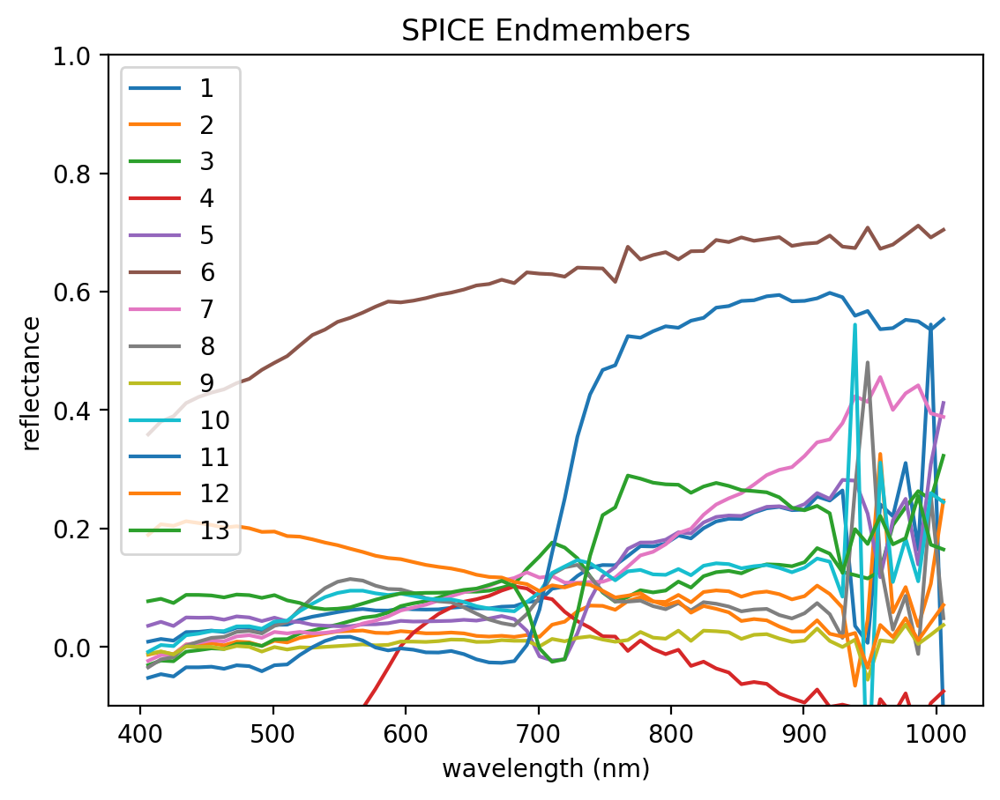

In [24]:
# Graficamos los endmembers
plt.plot(wvl,eM)
plt.xlabel('wavelength (nm)')
plt.ylabel('reflectance')
plt.legend([str(i+1) for i in range(n_em)], loc='upper left')
plt.ylim((-0.1,1))
plt.title('SPICE Endmembers')
plt.show()

Como era de esperarse, nuevamente empieza a predecir firmas espectrales de manera estocástica cuando el número de endmembers inicial (20 por defecto) es alto, aunque asumo que en imágenes espectrales, con muchísimos endmembers, podría funcionar bien. Además, se logra observar que algunas se superponen con otras, por lo tanto podemos hacer inferencia, basándonos en los primeros experimentos, sobre cuántas 'endmembers', aproximadamente, hay realmente.

In [29]:
params = SPICEParameters()
params.M = 7 # Número de Endmembers inicial
params.u = 0.05

# ejecutar SPICE
[eM,dsP] = SPICE(inputData, params)

 
Change in Objective Function Value: inf
Minimum of Maximum Proportions: 0.9999999999999648
Number of Endmembers: 7
Iteration: 1
 
 
Change in Objective Function Value: 0.05287664359603639
Minimum of Maximum Proportions: 0.7123641658428214
Number of Endmembers: 7
Iteration: 2
 
 
Change in Objective Function Value: 0.07913987574210779
Minimum of Maximum Proportions: 0.5934093334447986
Number of Endmembers: 7
Iteration: 3
 
 
Change in Objective Function Value: 5.201059385735679
Minimum of Maximum Proportions: 3.885780586188048e-16
Number of Endmembers: 6
Iteration: 4
 
 
Change in Objective Function Value: 5.273959563835948
Minimum of Maximum Proportions: 0.0
Number of Endmembers: 5
Iteration: 5
 
 
Change in Objective Function Value: 0.004149387751837708
Minimum of Maximum Proportions: 0.9020261340702831
Number of Endmembers: 5
Iteration: 6
 
 
Change in Objective Function Value: 0.009191609817122526
Minimum of Maximum Proportions: 0.9379418533181278
Number of Endmembers: 5
Iteration

In [30]:
# Ahora que ya tenemos endmembers, descomponemos la matriz de datos completa en lugar de los datos de la muestra reducida.
P = unmix2(inputData, eM) # Datos totales y endmembers encontrados con SPICE
n_em = eM.shape[1]

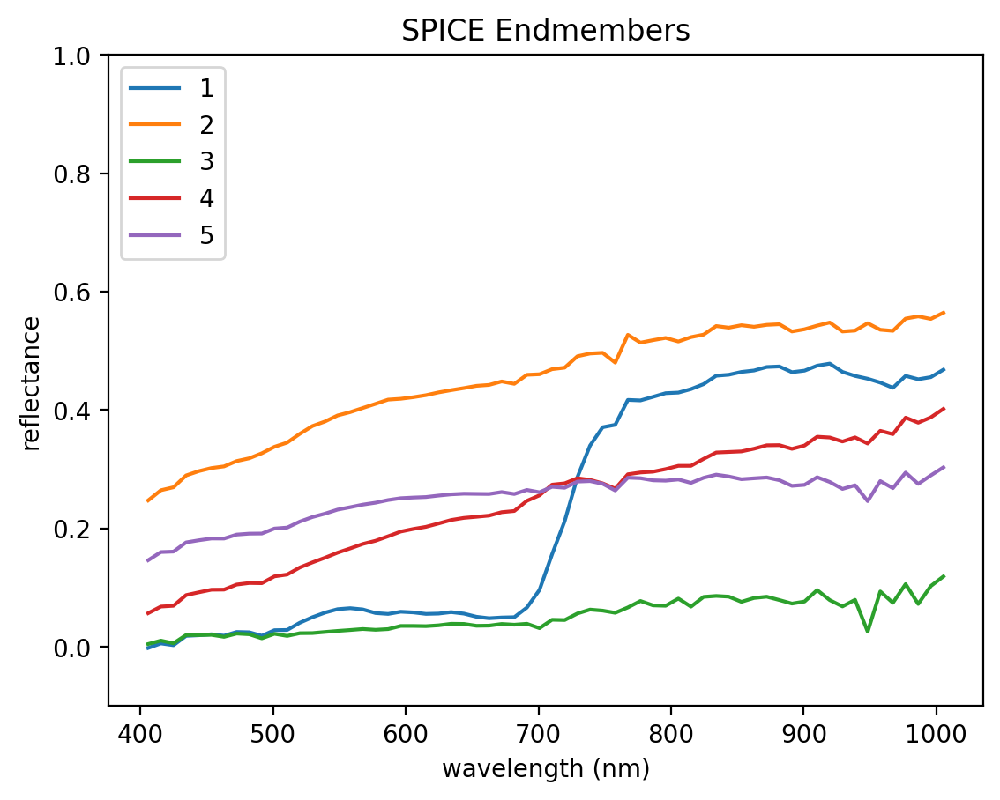

In [31]:
# Graficamos los endmembers
plt.plot(wvl,eM)
plt.xlabel('wavelength (nm)')
plt.ylabel('reflectance')
plt.legend([str(i+1) for i in range(n_em)], loc='upper left')
plt.ylim((-0.1,1))
plt.title('SPICE Endmembers')
plt.show()

# <font color='#4C5FDA'><small>**Trazamos los mapas de abundancia para los miembros finales obtenidos con SPICE**</small></font>

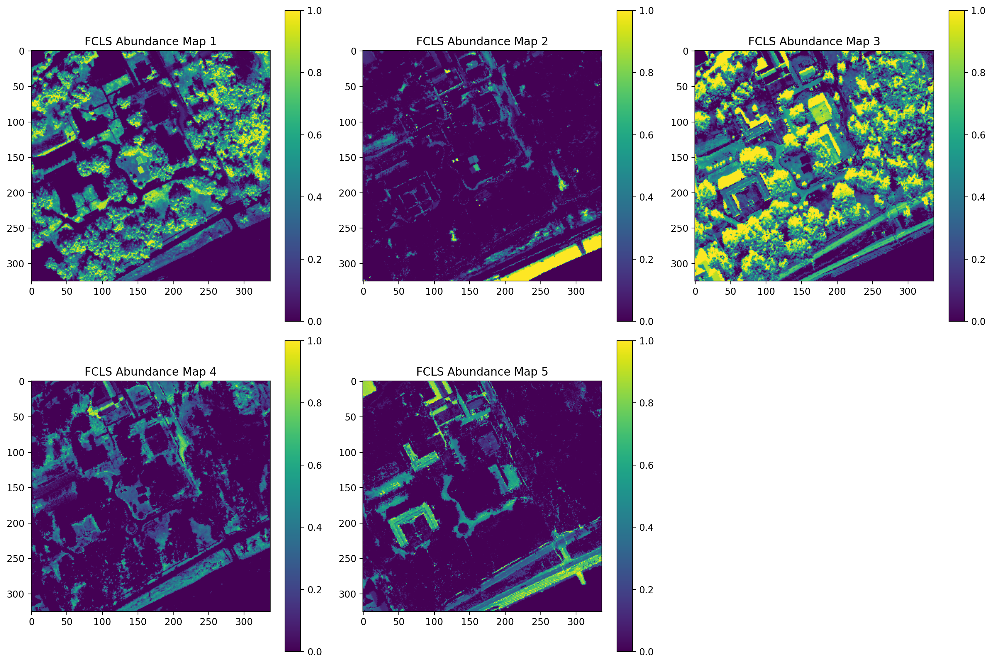

In [33]:
  # NO MODIFIQUE ESTA CELDA

P_imgs = []  # Crea una lista vacía para almacenar las imágenes generadas
for i in range(n_em):  # Itera sobre cada elemento identificado, donde n_em es el número total de elementos
    map_lin = np.zeros((n_r*n_c,))  # Crea un arreglo lineal de ceros con tamaño igual al número total de píxeles en la imagen
    map_lin[valid_array] = P[:,i]  # Asigna los valores correspondientes al elemento i a las posiciones válidas en el arreglo lineal
    P_imgs.append(np.reshape(map_lin, (n_r, n_c)))  # Convierte el arreglo lineal en una matriz 2D y la agrega a la lista de imágenes

# Determina el número de filas y columnas para la cuadrícula de subplots
n_cols = 3
n_rows = (n_em + n_cols - 1) // n_cols  # Calcula las filas necesarias, redondeando hacia arriba, basado en el total de elementos q

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 5))  # Crea una figura y subplots con las dimensiones especificadas

# Si hay menos mapas que espacios en la cuadrícula, oculta los ejes excedentes
for ax in axes.flat[len(P_imgs):]:
    ax.axis('off')

# Itera sobre el número de mapas y los dibuja en los subplots
for i, ax in enumerate(axes.flat):
    if i < len(P_imgs):  # Verifica si el índice está dentro del rango de imágenes disponibles
        im = ax.imshow(P_imgs[i], vmin=0, vmax=1)  # Muestra la imagen del elemento i con una escala de colores de 0 a 1
        fig.colorbar(im, ax=ax)
        ax.set_title(f'FCLS Abundance Map {i+1}')

plt.tight_layout()
plt.show()

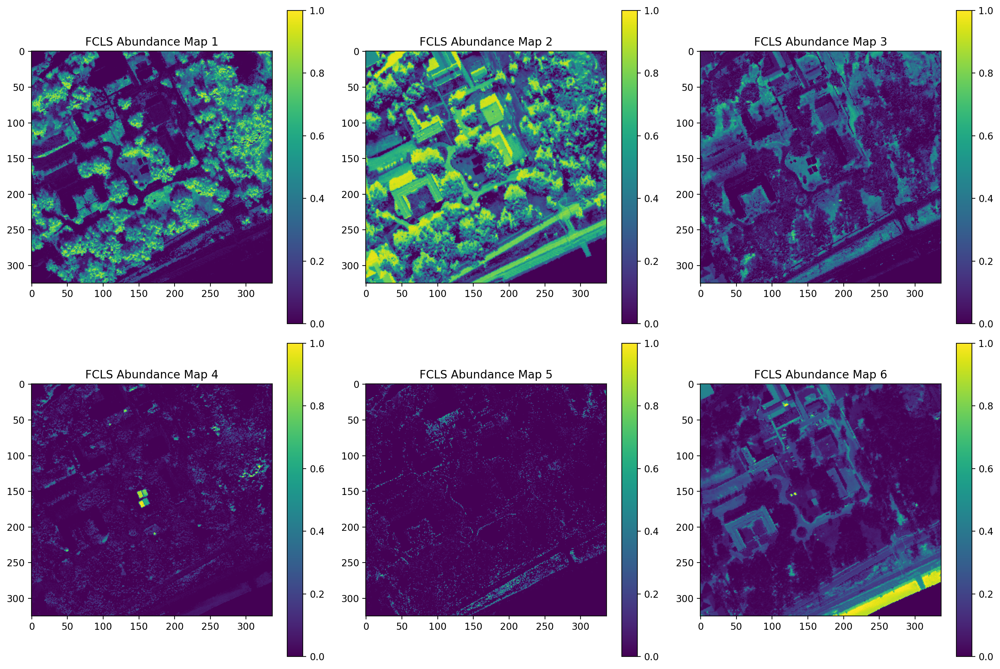

In [ ]:
# Resultados de referencia